In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os, glob, random

from tqdm import tqdm

import cv2
%matplotlib inline

pd.set_option('display.max_columns', None)

In [2]:
project_dir     = '/Users/k.choi/Documents/github/csiro_git'
data_dir        = os.path.join(project_dir, 'data')
img_dir         = os.path.join(data_dir, 'train')

In [3]:
img_list    = glob.glob(os.path.join(img_dir, '*.jpg'))
train_df    = pd.read_csv(os.path.join(data_dir, 'train.csv'))
columns     = train_df.columns; print(columns)
target_names  = train_df['target_name'].unique(); print(target_names)


Index(['sample_id', 'image_path', 'Sampling_Date', 'State', 'Species',
       'Pre_GSHH_NDVI', 'Height_Ave_cm', 'target_name', 'target'],
      dtype='object')
['Dry_Clover_g' 'Dry_Dead_g' 'Dry_Green_g' 'Dry_Total_g' 'GDM_g']


In [4]:
vegge = target_names[1]

num_samples = 10
sample_df  = train_df[train_df['target_name'] == vegge][['image_path', 'target']].copy()

low_df =  sample_df.nsmallest(num_samples, 'target').sample(1).iloc[0]
mid_df =  sample_df.iloc[ (sample_df['target'] - sample_df['target'].mean()).abs().argsort()[:num_samples] ].sample(1).iloc[0]
high_df = sample_df.nlargest(num_samples, 'target').sample(1).iloc[0]

sample_img_list = [ 
    { 'image_path': low_df['image_path'], 'target': low_df['target'], 'label': 'low' },
    { 'image_path': mid_df['image_path'], 'target': mid_df['target'], 'label': 'mid' },
    { 'image_path': high_df['image_path'], 'target': high_df['target'], 'label': 'high' },
]


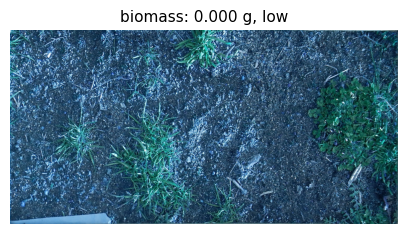

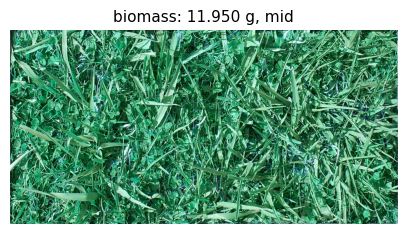

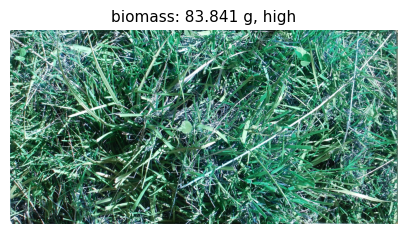

In [5]:
def img_show(path_, title_):
    img = cv2.imread(path_)
    plt.figure(figsize=(5, 3))
    plt.imshow(img)
    plt.title(title_, fontsize = 11)
    plt.axis('off')
    plt.show()

for i in range(3):

    paths = data_dir + '/' + sample_img_list[i]['image_path']
    title = f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}"

    img_show(paths, title)

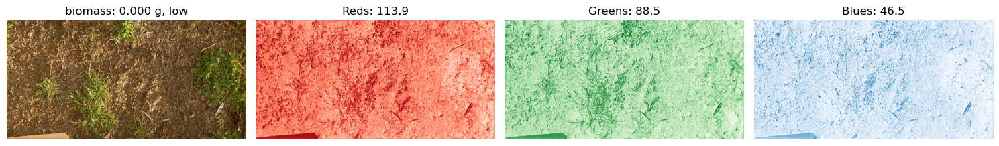

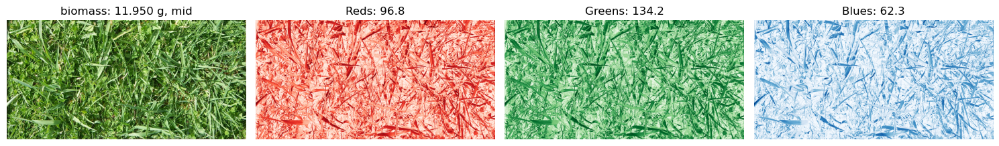

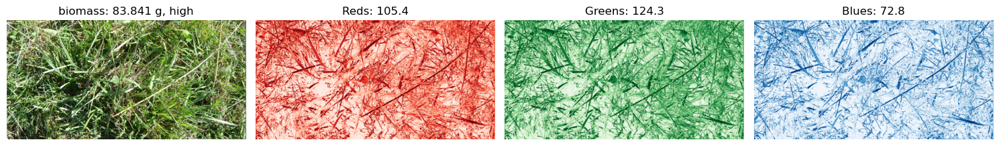

In [7]:

def get_rgb(path_): 
    return cv2.cvtColor(cv2.imread(path_), cv2.COLOR_BGR2RGB)

for i in range(3):
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')
    for j, c in enumerate(['Reds', 'Greens', 'Blues']):
        axes[j+1].imshow(img[:,:,j], cmap = c, vmin = 0, vmax = 255)
        axes[j+1].set_title(f"{c}: {img[:,:,j].mean():.1f}")
        axes[j+1].axis('off')
    plt.tight_layout(); plt.show()



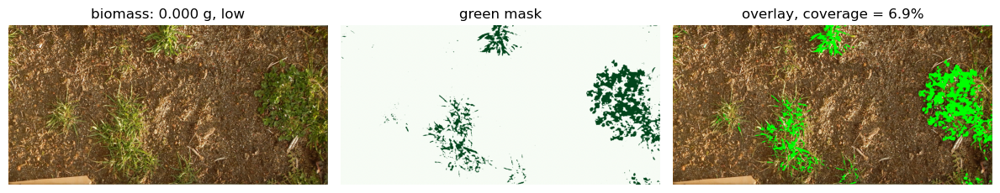

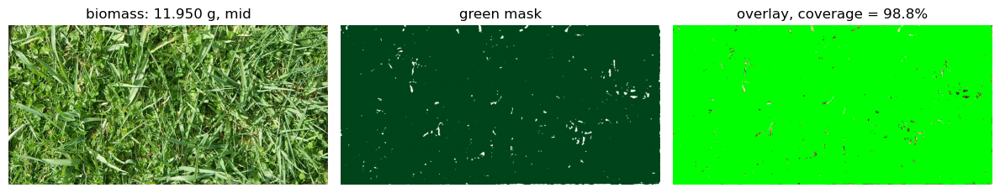

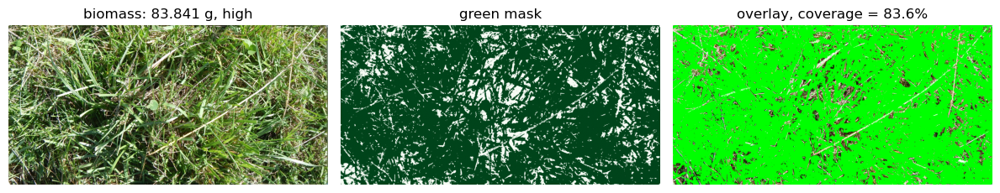

In [8]:

for i in range(3):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    g_mask = (img[:,:,1] > img[:,:,0]) & (img[:,:,1] > img[:,:,2])
    axes[1].imshow(g_mask, cmap = 'Greens')
    axes[1].set_title('green mask')
    axes[1].axis('off')
    
    overlay = img.copy()
    overlay[g_mask] = [0, 255, 0]
    axes[2].imshow(overlay, cmap = 'Greens')
    axes[2].set_title(f'overlay, coverage = {g_mask.sum()*100/g_mask.size:.1f}%')
    axes[2].axis('off')

    plt.tight_layout(); plt.show()
         

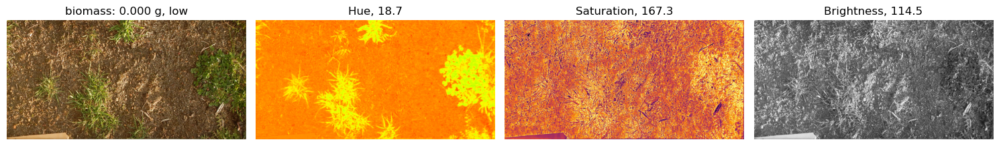

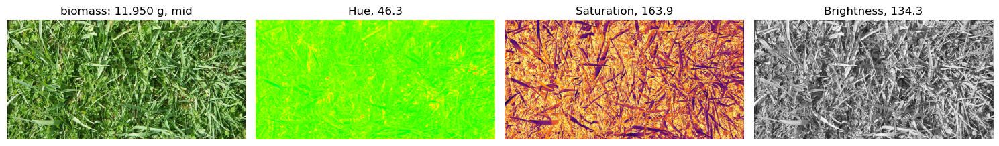

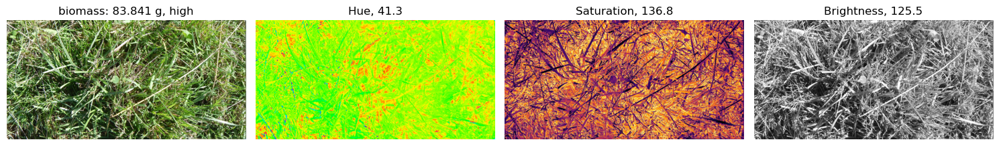

In [9]:
def get_hsv(path_):
    return cv2.cvtColor(cv2.imread(path_), cv2.COLOR_BGR2HSV)

for i in range(3):
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    for j, (c, cm) in enumerate(zip(['Hue', 'Saturation', 'Brightness'], ['hsv', 'inferno', 'gray'])):   
        axes[j+1].imshow(get_hsv(path)[:,:,j], cmap = cm)
        axes[j+1].set_title(f"{c}, {get_hsv(path)[:,:,j].mean():.1f}")
        axes[j+1].axis('off')
    plt.tight_layout(); plt.show()

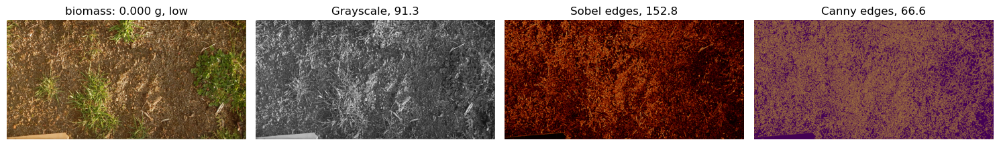

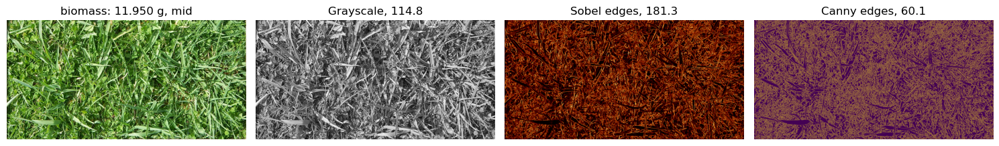

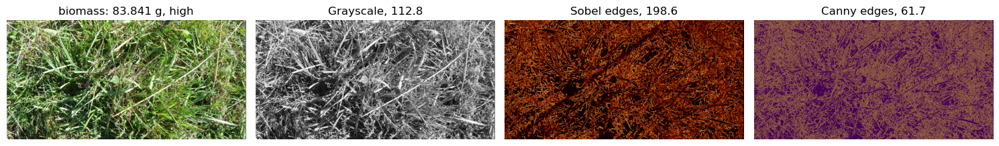

In [10]:
def get_gray(path_):
    return cv2.cvtColor(cv2.imread(path_), cv2.COLOR_BGR2GRAY)

def get_sobel(gray_):
    sobelx  = cv2.Sobel(gray_, cv2.CV_64F, 1, 0, ksize=3)
    sobely  = cv2.Sobel(gray_, cv2.CV_64F, 0, 1, ksize=3)
    return np.sqrt(sobelx**2 + sobely**2)

def get_canny(gray_): 
    return cv2.Canny(gray_, 100, 200) 

for i in range(3):
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    gray   = get_gray(path)
    sobel  = get_sobel(gray)
    canny  = get_canny(gray)

    img_arr = [gray, sobel, canny]; del gray, sobel, canny

    for j, (c, cm) in enumerate(zip(['Grayscale', 'Sobel edges', 'Canny edges'], ['gray', 'afmhot', 'viridis'])):
        axes[j+1].imshow(img_arr[j], cmap = cm)
        axes[j+1].set_title(f"{c}, {img_arr[j].mean():.1f}")
        axes[j+1].axis('off')
        
    plt.tight_layout(); plt.show()
    
    

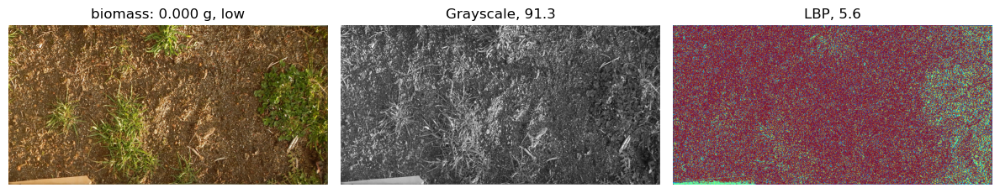

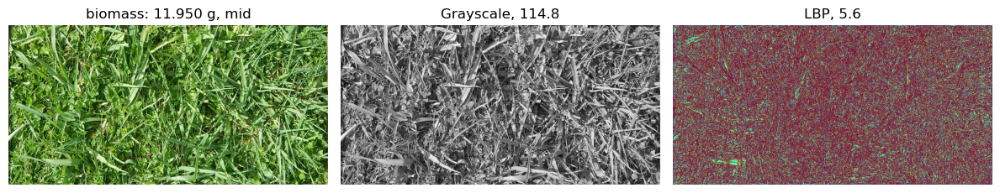

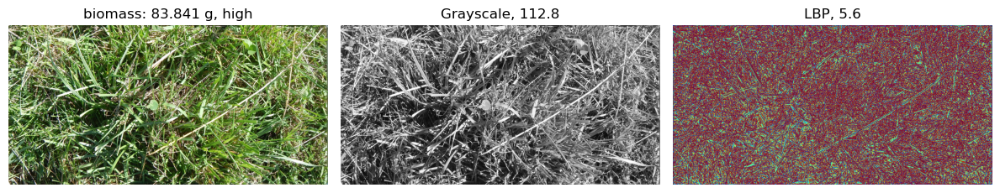

In [11]:
from skimage.feature import local_binary_pattern

# def resized_gray(path_):
#     img = cv2.imread(path_)
#     return cv2.resize(get_gray(path_), (256, 256))

def get_lbp(gray_):
    return local_binary_pattern(gray_, P=8, R=3, method="uniform")

for i in range(3):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    gray = get_gray(path)
    lbp  = get_lbp(gray)

    img_arr = [gray, lbp]; del gray, lbp
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    for j, (c, cm) in enumerate(zip(['Grayscale', 'LBP'], ['gray', 'jet'])):
        axes[j+1].imshow(img_arr[j], cmap = cm)
        axes[j+1].set_title(f"{c}, {img_arr[j].mean():.1f}")
        axes[j+1].axis('off')
    plt.tight_layout(); plt.show()




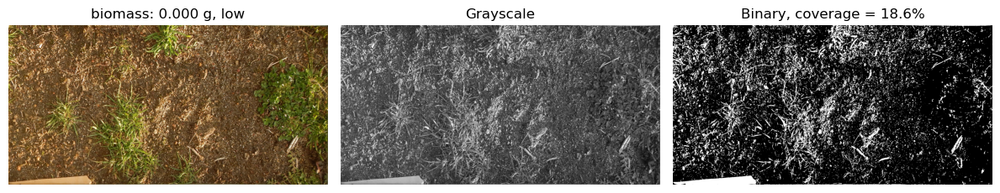

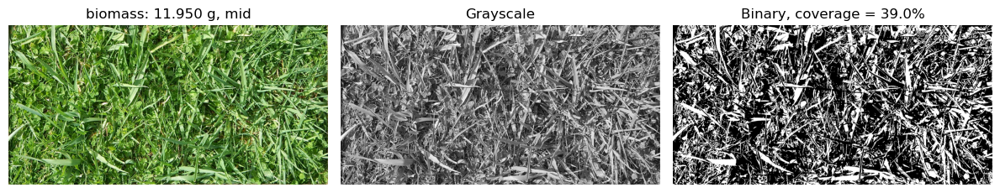

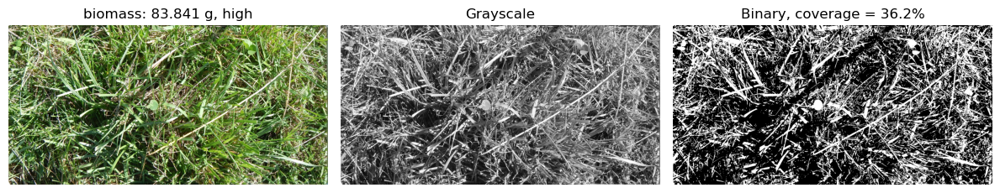

In [12]:
def get_binary(gray_):
    _, binary_ = cv2.threshold(gray_, 127, 255, cv2.THRESH_BINARY)
    if binary_.mean() > 127:
        binary = 255 - binary_
    return binary_

for i in range(3):

    fig, axes = plt.subplots(1, 3, figsize=(12, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    gray = get_gray(path)
    binary = get_binary(gray)

    if binary.mean() > 127:
        binary = 255 - binary

    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    axes[1].imshow(gray, cmap = 'gray')
    axes[1].set_title('Grayscale')
    axes[1].axis('off')

    axes[2].imshow(binary, cmap = 'gray')
    axes[2].set_title(f'Binary, coverage = { (binary>0).sum()*100/binary.size:.1f}%')
    axes[2].axis('off')

    plt.tight_layout(); plt.show()


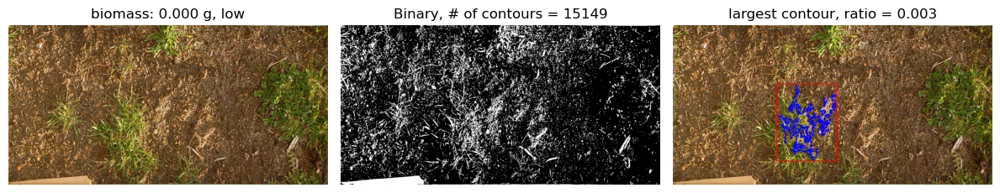

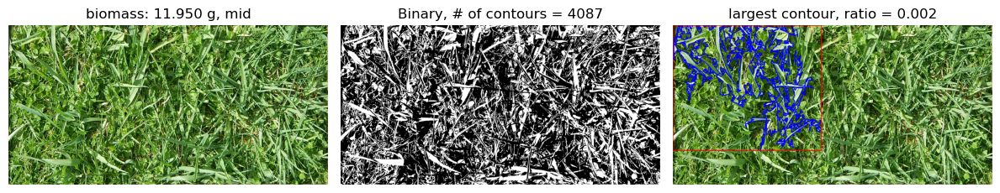

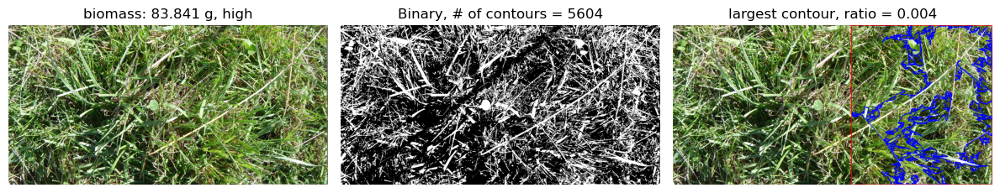

In [13]:
def get_contours(binary_):
    contours, _ = cv2.findContours(binary_, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

for i in range(3):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    gray = get_gray(path)
    binary = get_binary(gray)
    contours = get_contours(binary)

    if len(contours) > 0:
        max_contour = max(contours, key=cv2.contourArea)

        area = cv2.contourArea(max_contour)
        perimeter = cv2.arcLength(max_contour, True)

        if perimeter > 0:
            ratio = 4 * np.pi * area / perimeter**2
        else:
            ratio = 0

        x, y, w, h = cv2.boundingRect(max_contour)

        img_contour = img.copy()
        cv2.drawContours(img_contour, [max_contour], -1, (0, 0, 255), 3)
        cv2.rectangle(img_contour, (x, y), (x+w, y+h), (255, 0, 0), 3)

    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    axes[1].imshow(binary, cmap = 'gray')
    axes[1].set_title(f'Binary, # of contours = {len(contours)}')
    axes[1].axis('off')

    axes[2].imshow(img_contour, cmap = 'gray')
    axes[2].set_title(f'largest contour, ratio = {ratio:.3f}')
    axes[2].axis('off')
    plt.tight_layout(); plt.show()
    
    
